In [1]:
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
from scipy.ndimage.filters import gaussian_filter1d
import sqlite3 as sql
import os
import pandas as pd
from datetime import datetime
from glob import glob
import sklearn as sk
import sklearn.linear_model

os.sys.path.append('../')
import PlaceCellAnalysis as pc
import utilities as u
import preprocessing as pp
import behavior as b
import BayesianDecoding as bd


%load_ext autoreload
%autoreload 2

%matplotlib inline

C:\Users\mplitt\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
# load session
mouse = '4139224.3'
df = pp.load_session_db()


#df = df[df['RewardCount']>30]
df = df[df['Imaging']==1]
df = df.sort_values(['MouseName','DateTime','SessionNumber'])

df_mouse = df[df['MouseName'].str.match(mouse)]
df_mouse = df_mouse[df_mouse['Track'].str.match('TwoTower_noTimeout') | df_mouse['Track'].str.match('TwoTower_Timeout')]
df_mouse

,MouseName,DateFolder,SessionNumber,Track,RewardCount,Imaging,ImagingRegion,DateTime,data file,scanfile,scanmat
823,4139224.3,18_10_2018,1,TwoTower_noTimeout,61,1,CA1,2018-10-18,G:\My Drive\\VR_Data\TwoTower\4139224.3\18_10_...,G:\My Drive\2P_Data\TwoTower\4139224.3\18_10_2...,G:\My Drive\2P_Data\TwoTower\4139224.3\18_10_2...
825,4139224.3,18_10_2018,3,TwoTower_noTimeout,41,1,CA1,2018-10-18,G:\My Drive\\VR_Data\TwoTower\4139224.3\18_10_...,G:\My Drive\2P_Data\TwoTower\4139224.3\18_10_2...,G:\My Drive\2P_Data\TwoTower\4139224.3\18_10_2...
859,4139224.3,20_10_2018,2,TwoTower_noTimeout,60,1,CA1,2018-10-20,G:\My Drive\\VR_Data\TwoTower\4139224.3\20_10_...,G:\My Drive\2P_Data\TwoTower\4139224.3\20_10_2...,G:\My Drive\2P_Data\TwoTower\4139224.3\20_10_2...
897,4139224.3,23_10_2018,1,TwoTower_Timeout,48,1,CA1,2018-10-23,G:\My Drive\\VR_Data\TwoTower\4139224.3\23_10_...,G:\My Drive\2P_Data\TwoTower\4139224.3\23_10_2...,G:\My Drive\2P_Data\TwoTower\4139224.3\23_10_2...
927,4139224.3,25_10_2018,1,TwoTower_Timeout,69,1,,2018-10-25,G:\My Drive\\VR_Data\TwoTower\4139224.3\25_10_...,G:\My Drive\2P_Data\TwoTower\4139224.3\25_10_2...,G:\My Drive\2P_Data\TwoTower\4139224.3\25_10_2...
951,4139224.3,26_10_2018,3,TwoTower_Timeout,72,1,CA1,2018-10-26,G:\My Drive\\VR_Data\TwoTower\4139224.3\26_10_...,G:\My Drive\2P_Data\TwoTower\4139224.3\26_10_2...,G:\My Drive\2P_Data\TwoTower\4139224.3\26_10_2...
967,4139224.3,27_10_2018,4,TwoTower_Timeout,67,1,CA1,2018-10-27,G:\My Drive\\VR_Data\TwoTower\4139224.3\27_10_...,G:\My Drive\2P_Data\TwoTower\4139224.3\27_10_2...,G:\My Drive\2P_Data\TwoTower\4139224.3\27_10_2...
977,4139224.3,29_10_2018,1,TwoTower_Timeout,71,1,CA1,2018-10-29,G:\My Drive\\VR_Data\TwoTower\4139224.3\29_10_...,G:\My Drive\2P_Data\TwoTower\4139224.3\29_10_2...,G:\My Drive\2P_Data\TwoTower\4139224.3\29_10_2...
988,4139224.3,30_10_2018,1,TwoTower_Timeout,78,1,CA1,2018-10-30,G:\My Drive\\VR_Data\TwoTower\4139224.3\30_10_...,G:\My Drive\2P_Data\TwoTower\4139224.3\30_10_2...,G:\My Drive\2P_Data\TwoTower\4139224.3\30_10_2...
1001,4139224.3,31_10_2018,2,TwoTower_Timeout,66,1,CA1,2018-10-31,G:\My Drive\\VR_Data\TwoTower\4139224.3\31_10_...,G:\My Drive\2P_Data\TwoTower\4139224.3\31_10_2...,G:\My Drive\2P_Data\TwoTower\4139224.3\31_10_2...


C:\Users\mplitt\Anaconda3\lib\site-packages\pandas\core\frame.py:3035: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)
C:\Users\mplitt\MightyMorphingPhotonRangers\utilities.py:189: RuntimeWarning: Mean of empty slice
  zone1_speed[i] = np.nanmean(sub_frame.loc[zone1_mask,'speed'])


((<matplotlib.figure.Figure at 0x208d3ec5828>,
  <matplotlib.axes._subplots.AxesSubplot at 0x208d3ec5fd0>),
 (<matplotlib.figure.Figure at 0x208ca557ba8>,
  <matplotlib.axes._subplots.AxesSubplot at 0x208d1dcd160>),
 (<matplotlib.figure.Figure at 0x208d4386160>,
  <matplotlib.axes._subplots.AxesSubplot at 0x208d4386908>))

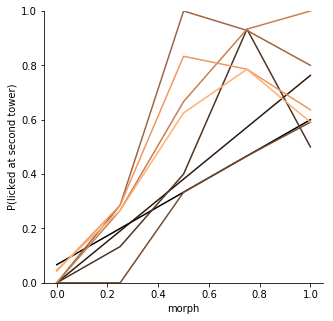

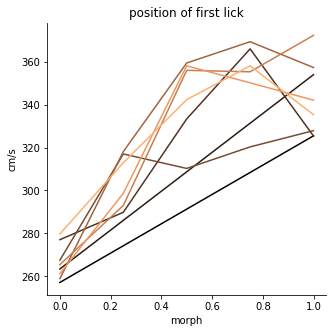

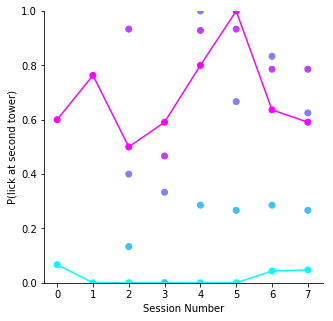

In [3]:
data = pp.behavior_dataframe([df_mouse['data file'].iloc[i] for i in range(3,df_mouse.shape[0],1)],concat=False)
b.learning_curve_plots(data)

In [4]:
VRDat,C,Cd, S, A = pp.load_scan_sess(df_mouse.iloc[8])
trial_info, tstart_inds, teleport_inds = u.by_trial_info(VRDat)


G:\My Drive\2P_Data\TwoTower\4139224.3\30_10_2018\TwoTower_Timeout\TwoTower_Timeout_001_002.mat


C:\Users\mplitt\MightyMorphingPhotonRangers\preprocessing.py:186: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  frame['ca inds'] = caInds
C:\Users\mplitt\Anaconda3\lib\site-packages\pandas\core\frame.py:3035: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)


G:\My Drive\2P_Data\TwoTower\4139224.3\30_10_2018\TwoTower_Timeout\TwoTower_Timeout_001_002.mat
#subsystem#not made into numpy array
frame diff 0


C:\Users\mplitt\MightyMorphingPhotonRangers\utilities.py:189: RuntimeWarning: Mean of empty slice
  zone1_speed[i] = np.nanmean(sub_frame.loc[zone1_mask,'speed'])


In [5]:
C_trial_mat, occ_trial_mat, edges,centers = u.make_pos_bin_trial_matrices(C,VRDat['pos']._values,VRDat['tstart']._values,VRDat['teleport']._values)
C_morph_dict = u.trial_type_dict(C_trial_mat,trial_info['morphs'])

In [8]:
C_z = sp.stats.zscore(C,axis=0)
trial_info, tstart_inds, teleport_inds = u.by_trial_info(VRDat)
C_z_trial_mat, occ_trial_mat, edges,centers = u.make_pos_bin_trial_matrices(C_z,VRDat['pos']._values,VRDat['tstart']._values,VRDat['teleport']._values)

# find position transition probabilities
morph0inds = VRDat['morph']==0
XX_I0, xbins = bd.transition_prob_matrix(VRDat['pos']._values[morph0inds],binsize=5)

morph1inds = VRDat['morph']==1
XX_I1, xbins = bd.transition_prob_matrix(VRDat['pos']._values[morph1inds],binsize=5)
xbins = np.array(xbins)
pos_binned = np.digitize(VRDat['pos']._values,xbins,right=True)

# get some more by trial info without averaging in spatial bins
pcnt = np.zeros([VRDat.shape[0],])
trial_pos, trial_C_z  = [], []
trial_pos_binned = []
trial_licks = []
for i,(start,stop) in enumerate(zip(tstart_inds,teleport_inds)):
    pos = VRDat['pos']._values[start:stop]
    trial_pos.append(pos)
    trial_C_z.append(C_z[start:stop,:]) # restrict to well fit cells
    trial_pos_binned.append(pos_binned[start:stop])
    lick_inds = np.where(VRDat['lick']._values[start:stop]>0)[0]
    licks = np.zeros(pos.shape)
    licks[:]=np.nan
    licks[lick_inds]=pos[lick_inds]
    trial_licks.append(licks)
    pcnt[start:stop] = int(trial_info['rewards'][i]>0)

#  set up encoding models
dmat = bd.pos_morph_design_matrix(VRDat['pos']._values,VRDat['morph']._values,speed=VRDat['speed']._values)
train_inds = (((VRDat['morph']==1) | (VRDat['morph']==0)) & (VRDat['pos']>0)) & (pcnt>0)# & (VRDat['trial number']<np.max(VRDat['trial number']._values)*.67)
#ttrain_inds = (((VRDat['morph']==1) | (VRDat['morph']==0)) & (VRDat['pos']>0)) & (pcnt>0) & (VRDat['trial number']>=np.max(VRDat['trial number']._values)*.67)
dmat_extreme = dmat[train_inds,:]
C_extreme = C_z[train_inds,:]

glm_base = sk.linear_model.LinearRegression()

# for cells in session
glm_base.fit(dmat_extreme,C_extreme)
mu_extreme_hat = glm_base.predict(dmat_extreme)

# get data for estimating all likelihoods
test_inds = VRDat['pos']>0
d0 = bd.pos_morph_design_matrix(VRDat['pos']._values,
                                np.zeros([VRDat['pos'].shape[0],]),
                                speed=VRDat['speed']._values)
d1 = bd.pos_morph_design_matrix(VRDat['pos']._values,
                                np.ones([VRDat['pos'].shape[0],]),
                                speed=VRDat['speed']._values)
d0 = d0[test_inds,:]
d1 = d1[test_inds,:]
mu_i0 = glm_base.predict(d0)
mu_i1 = glm_base.predict(d1)


C:\Users\mplitt\MightyMorphingPhotonRangers\utilities.py:189: RuntimeWarning: Mean of empty slice
  zone1_speed[i] = np.nanmean(sub_frame.loc[zone1_mask,'speed'])


In [244]:
h = 500
for cell in range(0,C_z.shape[1],100):
    cellTS = C_z[:,cell]
    H = np.zeros([cellTS.shape[0],h])
    cellTSpad = np.append(np.zeros([h]),cellTS)
    for i in range(H.shape[0]):
        H[i,:] = cellTSpad[i:i+h-1]

    print(H.shape)

    dhmat = np.hstack((dmat,H))
    dhmat_extreme = dhmat[train_inds,:]

    glm_hist = sk.linear_model.LinearRegression(normalize=True)
    #glm_hist.fit(dhmat_extreme,cellTS[train_inds])
    glm_hist.fit(H[train_inds,:],cellTS[train_inds])
    #mu_xtreme_hist = glm_hist.predict(dhmat[ttrain_inds,:])
    mu_xtreme_hist = glm_hist.predict(H[ttrain_inds,:])
    
    f, ax = plt.subplots(figsize=[15,3])
    ax.plot(cellTS[ttrain_inds])
    ax.plot(mu_xtreme_hist)
    


ValueError: could not broadcast input array from shape (499) into shape (500)

In [54]:
# predict activity from all other cells
def morph_coef(H,morphs):
    HH = np.zeros(H.shape)
    for t in range(H.shape[0]):
        HH[t,:]=H[t,:]*morphs[t]
    return HH

mu_i0, mu_i1 = np.zeros(C_z.shape), np.zeros(C_z.shape)
MU_xtreme = np.zeros(C_z[train_inds,:].shape)
GLMs = []
for cell in range(0,C_z.shape[1]):
    print(cell)
    cellTS=C_z[:,cell]
    mask=np.arange(C_z.shape[1])!=cell
    print(np.where(mask==False)[0])
    H = C_z[:,mask]
    
    #dhmat = np.hstack((dmat,H,HH))
    dhmat = np.hstack((H,HH))
    #dhmat = H
    dhmat_extreme = dhmat[train_inds,:]

    
    #glm = sk.linear_model.ElasticNet(l1_ratio= .5,alpha=.001 ,normalize=True)
    glm = sk.linear_model.LassoCV(n_alphas=5 ,normalize=True)
    
#     glm = sk.linear_model.RidgeCV(normalize=True)
    glm.fit(dhmat_extreme,cellTS[train_inds])
    GLMs.append(glm)
    mu_xtreme = glm.predict(dhmat[train_inds,:])
    MU_xtreme[:,cell]=mu_xtreme
    
    # predict if morph 0
    d0 = bd.pos_morph_design_matrix(VRDat['pos']._values,
                                np.zeros([VRDat['pos'].shape[0],]),
                                speed=VRDat['speed']._values)
    
    HH0 = morph_coef(H,np.zeros([VRDat['pos'].shape[0],]))
    #dmat_0 = np.hstack((d0,H,HH0))
    dmat_0 = np.hstack((H,HH0))
    mu_i0[:,cell]=glm.predict(dmat_0)
    
    
    d1 = bd.pos_morph_design_matrix(VRDat['pos']._values,
                                np.ones([VRDat['pos'].shape[0],]),
                                speed=VRDat['speed']._values)
    HH1 = morph_coef(H,np.ones([VRDat['pos'].shape[0],]))
#     dmat_1 = np.hstack((d1,H,HH1))
    dmat_1 = np.hstack((H,HH1))
    mu_i1[:,cell]=glm.predict(dmat_1)
    
    
    
#     f, ax = plt.subplots(figsize=[15,3])
#     ax.plot(cellTS,color='black')
#     ax.plot(mu_i1[:,cell],color=plt.cm.cool(1.))
#     ax.plot(mu_i0[:,cell],color=plt.cm.cool(0.))
    


0
[0]


C:\Users\mplitt\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


1
[1]


C:\Users\mplitt\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


2
[2]


C:\Users\mplitt\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\mplitt\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


3
[3]


C:\Users\mplitt\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


4
[4]


C:\Users\mplitt\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


5
[5]


C:\Users\mplitt\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


6
[6]


C:\Users\mplitt\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


7
[7]


C:\Users\mplitt\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


8
[8]


KeyboardInterrupt: 

C:\Users\mplitt\Anaconda3\lib\site-packages\matplotlib\pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


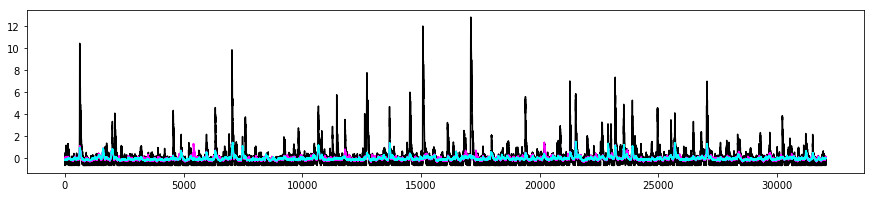

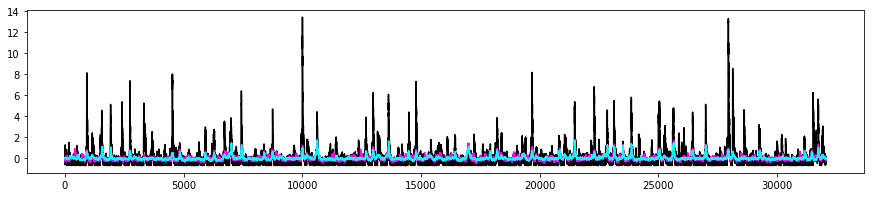

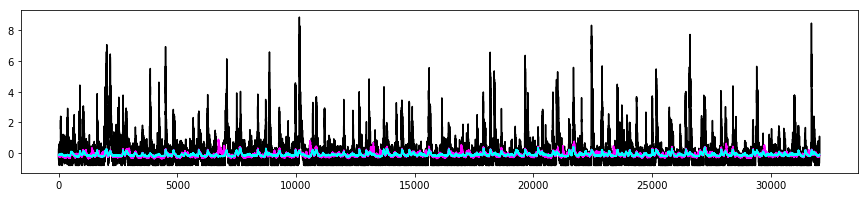

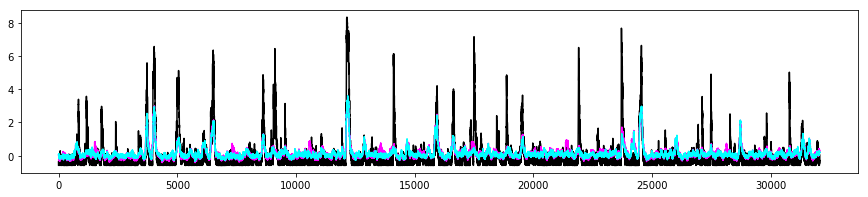

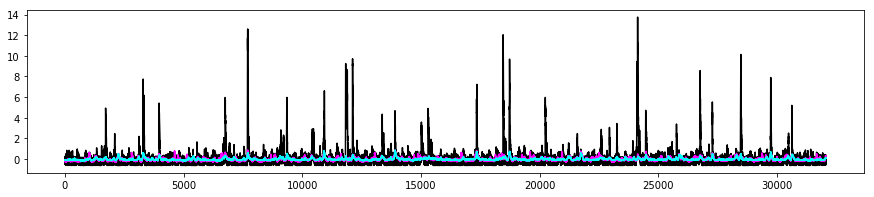

...

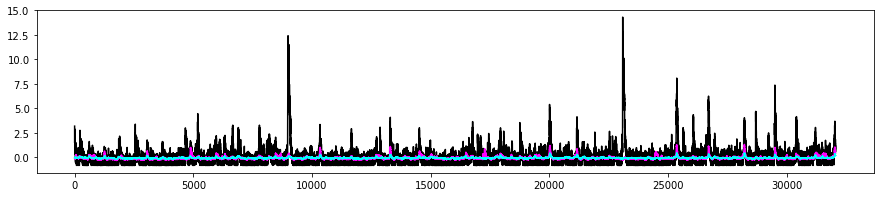

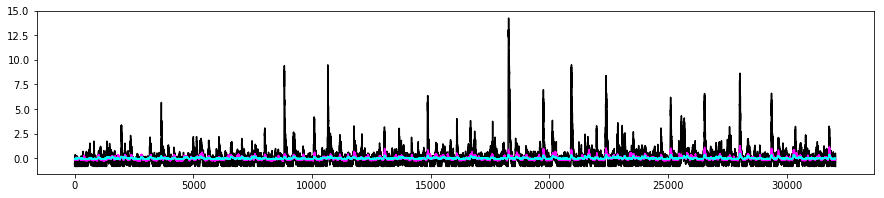

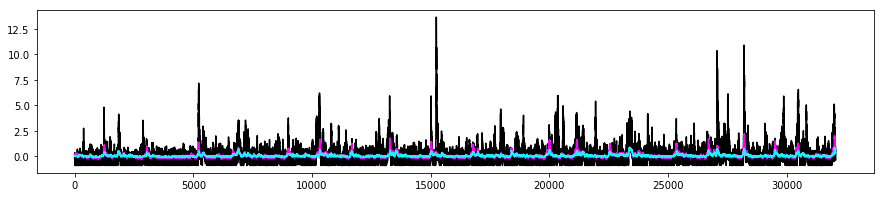

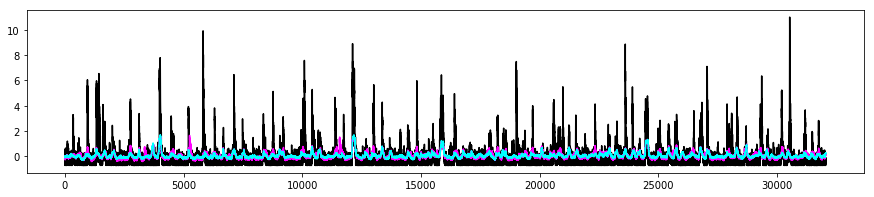

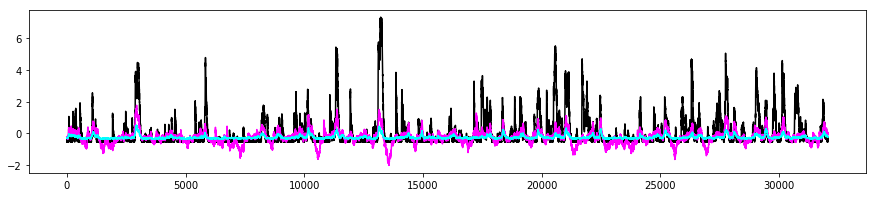

In [41]:
for cell in range(0,C_z.shape[1],10):
    f, ax = plt.subplots(figsize=[15,3])
    ax.plot(C_z[:,cell],color='black')
    ax.plot(mu_i1[:,cell],color=plt.cm.cool(1.))
    ax.plot(mu_i0[:,cell],color=plt.cm.cool(0.))
    

C:\Users\mplitt\Anaconda3\lib\site-packages\matplotlib\pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


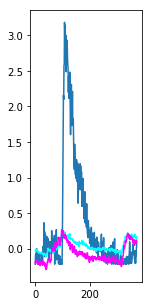

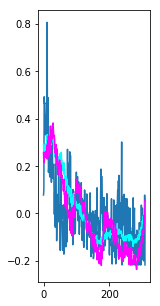

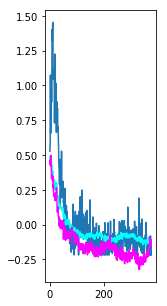

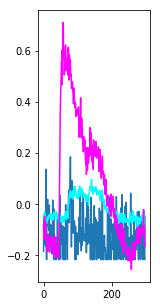

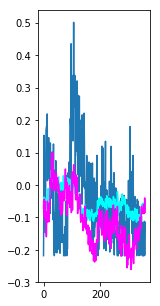

...

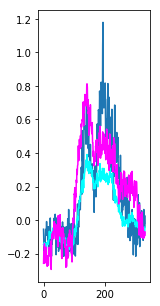

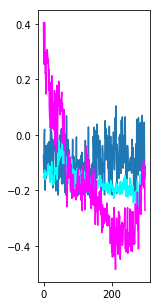

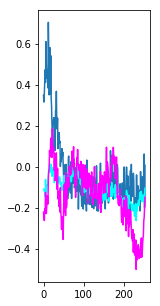

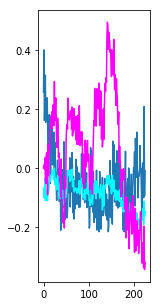

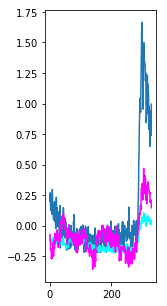

In [45]:
for j in [5, 100, 500]: #range(0,C_z.shape[1],1000):
    
    for i,(start,stop) in enumerate(zip(tstart_inds,teleport_inds)):
        f, ax = plt.subplots(figsize=[2,5])
        ax.plot(C_z[start:stop,j]/3)
        ax.plot(mu_i0[start:stop,j],color=plt.cm.cool(0.))
        ax.plot(mu_i1[start:stop,j],color=plt.cm.cool(1.))


G:\My Drive\2P_Data\TwoTower\4139224.3\30_10_2018\TwoTower_Timeout\TwoTower_Timeout_001_002.mat


C:\Users\mplitt\MightyMorphingPhotonRangers\preprocessing.py:186: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  frame['ca inds'] = caInds
C:\Users\mplitt\Anaconda3\lib\site-packages\pandas\core\frame.py:3035: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)


G:\My Drive\2P_Data\TwoTower\4139224.3\30_10_2018\TwoTower_Timeout\TwoTower_Timeout_001_002.mat
#subsystem#not made into numpy array
frame diff 0


C:\Users\mplitt\MightyMorphingPhotonRangers\utilities.py:189: RuntimeWarning: Mean of empty slice
  zone1_speed[i] = np.nanmean(sub_frame.loc[zone1_mask,'speed'])


processing trial 0


C:\Users\mplitt\MightyMorphingPhotonRangers\BayesianDecoding.py:217: RuntimeWarning: divide by zero encountered in log
  log_tmpnum0 = log_L0 + np.squeeze(np.log(XXZZ0))
C:\Users\mplitt\MightyMorphingPhotonRangers\BayesianDecoding.py:224: RuntimeWarning: divide by zero encountered in log
  log_tmpnum1 = log_L1 + np.squeeze(np.log(XXZZ1))


processing trial 5
processing trial 10
processing trial 15
processing trial 20
processing trial 25
processing trial 30
processing trial 35
processing trial 40
processing trial 45
processing trial 50
processing trial 55
processing trial 60
processing trial 65
processing trial 70
processing trial 75
processing trial 80
processing trial 85


C:\Users\mplitt\Anaconda3\lib\site-packages\matplotlib\pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


(32058,)


C:\Users\mplitt\MightyMorphingPhotonRangers\BayesianDecoding.py:419: RuntimeWarning: invalid value encountered in true_divide
  avgTrace[key] = np.divide(avgTrace[key],mcount[key])


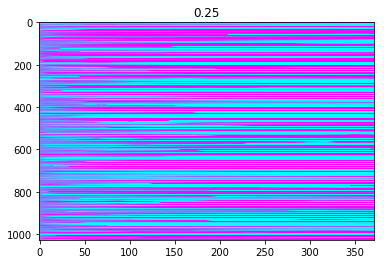

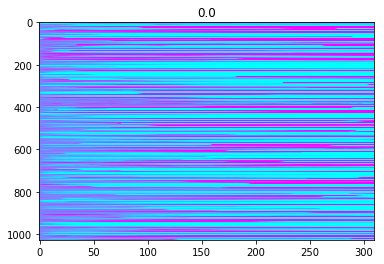

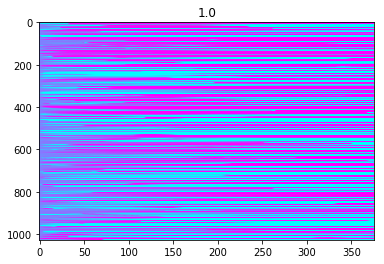

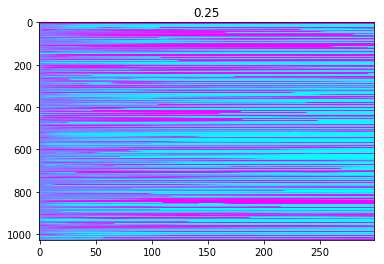

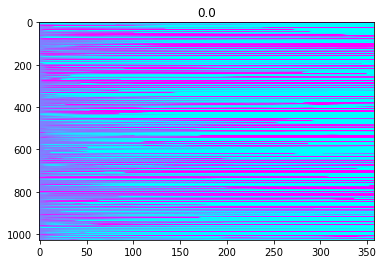

...

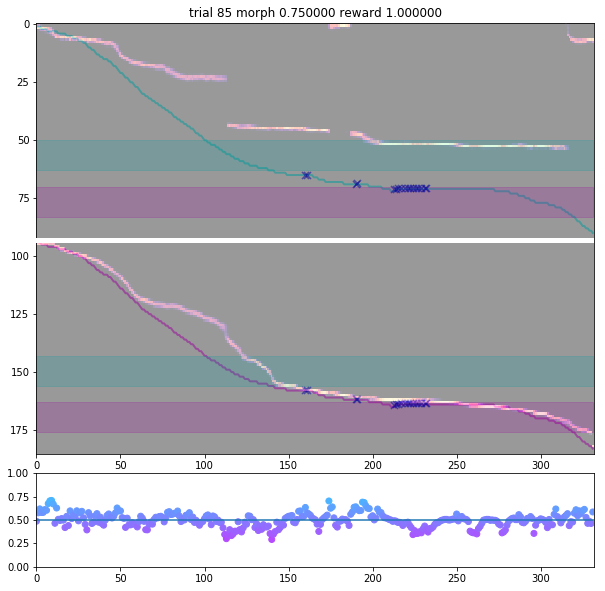

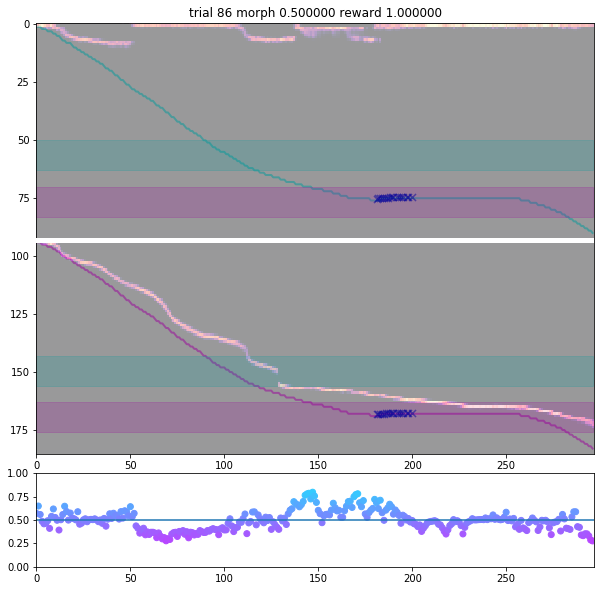

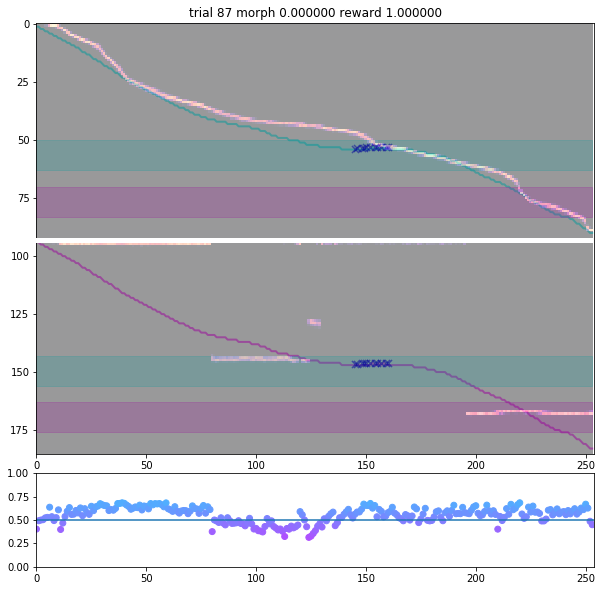

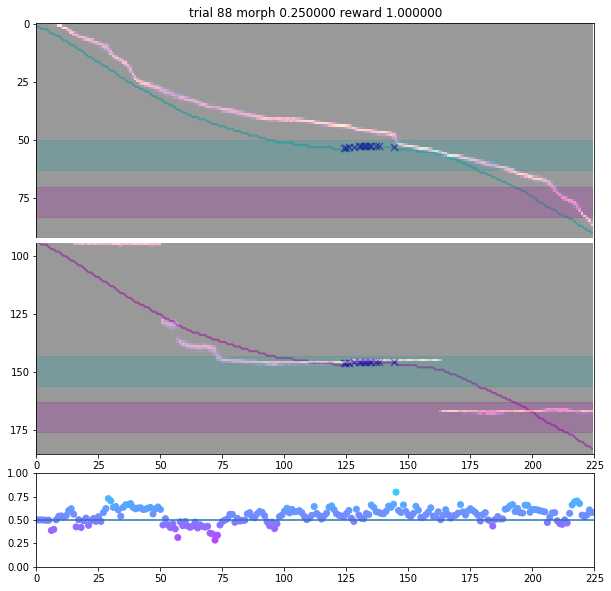

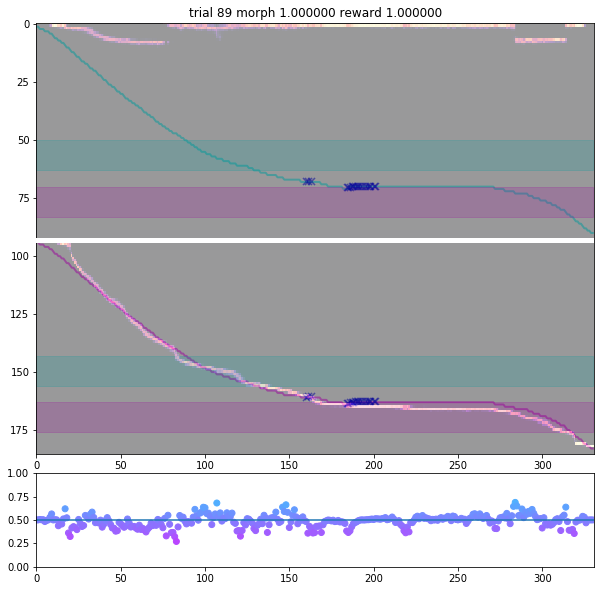

In [3]:
decode_dict = bd.single_session(df_mouse.iloc[8])

In [18]:
i1 = np.zeros([trial_info['morphs'].shape[0],C.shape[1]])
for i, (tmppost,m) in enumerate(zip(decode_dict['i1'],trial_info['morphs'])):
    i1[i,:] = tmppost[-1,:]
    
i1_dict = u.trial_type_dict(i1,trial_info['morphs'])
i1_seq = [i1_dict[m] for m in [0,.25,.5,.75,1]]
print(i1_seq[0].shape)

(23, 1027)


C:\Users\mplitt\Anaconda3\lib\site-packages\matplotlib\pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


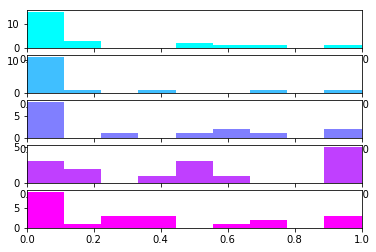

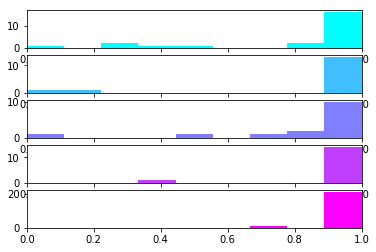

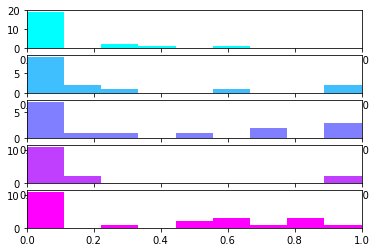

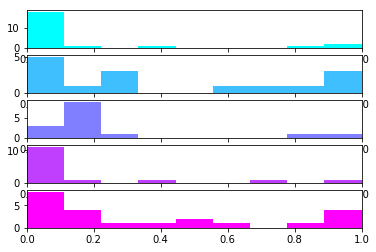

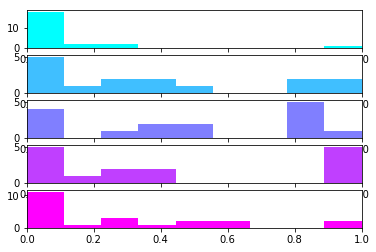

...

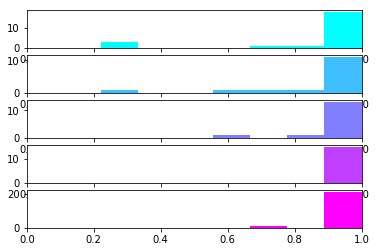

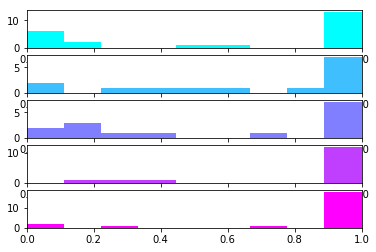

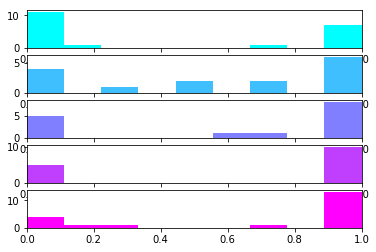

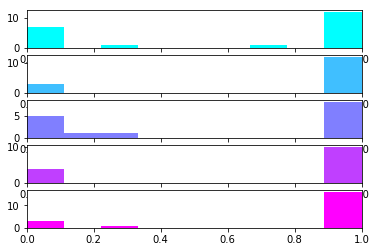

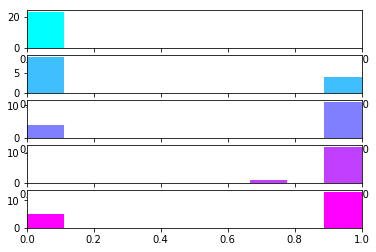

In [177]:
bs = np.linspace(0,1,num=10)
for i in range(0,i1.shape[1],10):
    f,ax = plt.subplots(5,1)
    #i1_cell = [i1_seq[m][:,i] for m in range(len(i1_seq))]
    for j, morph in enumerate([0.,.25,.5,.75,1.]):
        ax[j].hist(i1_dict[morph][:,i],color=plt.cm.cool(morph),bins=bs)
        ax[j].set_xlim([0,1])

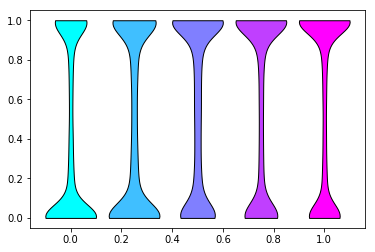

In [30]:
f, ax = plt.subplots()
i1_rav = [m.ravel() for m in i1_seq]
for i,morph in enumerate([0.,.25,.5,.75,1.]):
    parts = ax.violinplot(i1_rav[i],[morph],points=100,showextrema=False,widths=.2)
    for pc in parts['bodies']:
        pc.set_facecolor(plt.cm.cool(morph))
        pc.set_alpha(1)
        pc.set_edgecolor('black')

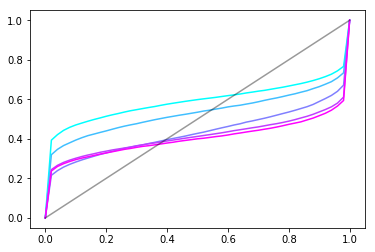

In [39]:
# plot cumulative distribution functions
i1_cdf = []
f,ax = plt.subplots()
for i, morph in enumerate([0.,.25,.5,.75,1.]):
    hist,edges = np.histogram(i1_rav[i],bins=50)
    hist = np.insert(hist,0,0)
    i1_cdf.append(np.cumsum(hist)/sum(hist))
    ax.plot(edges,np.cumsum(hist)/sum(hist),color=plt.cm.cool(morph))
    
ax.plot(edges,np.linspace(0,1,num=51),color='black',alpha=.4)




In [5]:
# fit encoding model - position x context

# run 10-fold cross validation and pick cells that model predicts variance significantly compared to shuffled distribution

# single cell decoding - look at last time point



In [46]:
# check morphed rate maps
trial_mu0,trial_m1 = [],[]
p1 = np.zeros([tstart_inds.shape[0],C_z.shape[1]])
ll1 = np.zeros([tstart_inds.shape[0],C_z.shape[1]])
LLR = np.zeros([tstart_inds.shape[0],])
for t, (tstart,tstop) in enumerate(zip(tstart_inds,teleport_inds)):
    mu0 = mu_i0[tstart:tstop,:]
    trial_mu0.append(mu0)
    mu1 = mu_i1[tstart:tstop,:]
    trial_m1.append(mu1)
    #pos = VRDat['pos']._values[tstart:tstop]
    L0 = bd.gaussian_pdf(trial_C_z[t],mu0,1)
    L1 = bd.gaussian_pdf(trial_C_z[t],mu1,1)
    
    l0 = np.log(L0).sum(axis=0)
    l1 = np.log(L1).sum(axis=0)
    
    L0 = np.sum(l0)
    L1 = np.sum(l1)
    LLR[t]=L1-L0
    
    biggest = np.max(np.append(l0.ravel(),l1.ravel()))
    l0+=2.00001
    l1+=2.00001
    ll1[t,:]=l1-l0
    l0 = np.exp(l0)
    l1 = np.exp(l1)
    
    p1[t,:] = np.divide(l1,(l0+l1))

p1[np.isnan(p1)]=0
p1_dict = u.trial_type_dict(p1,trial_info['morphs'])
p1_seq = [p1_dict[m] for m in [0,.25,.5,.75,1]]
p1_rav = [m.ravel() for m in p1_seq]

ll1[ll1==np.inf]=np.max(ll1[~np.isinf(ll1)].ravel())
ll1[ll1==-np.inf]=np.min(ll1[~np.isinf(ll1)].ravel())
#ll1[np.isnan(ll1)] = []
ll1_dict = u.trial_type_dict(ll1,trial_info['morphs'])
ll1_seq = [ll1_dict[m] for m in [0,.25,.5,.75,1]]
ll1_rav = [m.ravel() for m in ll1_seq]



C:\Users\mplitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:29: RuntimeWarning: invalid value encountered in true_divide


TypeError: 'PathCollection' object is not iterable

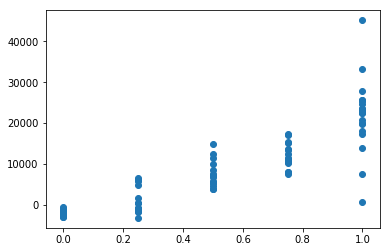

In [47]:
f,ax = plt.scatter(trial_info['morphs'],LLR)

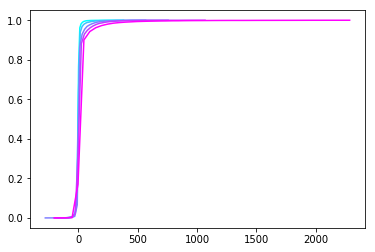

In [48]:
f,ax = plt.subplots()
i1_cdf = []
for i, morph in enumerate([0.,.25,.5,.75,1.]):
    hist,edges = np.histogram(ll1_rav[i][~np.isnan(ll1_rav[i])],bins=50)
    hist = np.insert(hist,0,0)
    cdf = np.cumsum(hist)/np.sum(hist)
    i1_cdf.append(cdf)
    ax.plot(edges,np.cumsum(hist)/sum(hist),color=plt.cm.cool(morph))
    
#ax.set_xlim([-200,200])

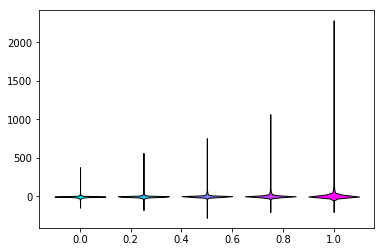

In [49]:
f, ax = plt.subplots()
for i,morph in enumerate([0.,.25,.5,.75,1.]):
    parts = ax.violinplot(ll1_rav[i][~np.isnan(ll1_rav[i])],[morph],points=100,showextrema=False,widths=.2)
    for pc in parts['bodies']:
        pc.set_facecolor(plt.cm.cool(morph))
        pc.set_alpha(1)
        pc.set_edgecolor('black')

In [50]:
uu = np.linspace(0,1,num=5000)
print('uniform: %4f' % sp.stats.kurtosis(uu))
for i,morph in enumerate([0.,.25,.5,.75,1.]):
    print(sp.stats.kurtosistest(ll1_rav[i][~np.isnan(ll1_rav[i])]))

uniform: -1.200000
KurtosistestResult(statistic=94.39966861816399, pvalue=0.0)
KurtosistestResult(statistic=78.82622895713193, pvalue=0.0)
KurtosistestResult(statistic=75.86068464306231, pvalue=0.0)
KurtosistestResult(statistic=73.86600295426068, pvalue=0.0)
KurtosistestResult(statistic=97.86611513066887, pvalue=0.0)


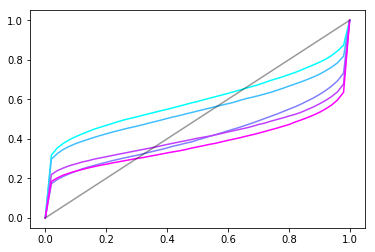

In [51]:
f,ax = plt.subplots()
for i, morph in enumerate([0.,.25,.5,.75,1.]):
    hist,edges = np.histogram(p1_rav[i],bins=50)
    hist = np.insert(hist,0,0)
    i1_cdf.append(np.cumsum(hist)/sum(hist))
    ax.plot(edges,np.cumsum(hist)/sum(hist),color=plt.cm.cool(morph))
    
ax.plot(edges,np.linspace(0,1,num=51),color='black',alpha=.4)
#ax.set_ylim([.3,.8])

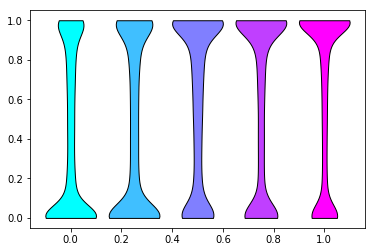

In [52]:
f, ax = plt.subplots()
for i,morph in enumerate([0.,.25,.5,.75,1.]):
    parts = ax.violinplot(p1_rav[i],[morph],points=100,showextrema=False,widths=.2)
    for pc in parts['bodies']:
        pc.set_facecolor(plt.cm.cool(morph))
        pc.set_alpha(1)
        pc.set_edgecolor('black')

In [53]:
uu = np.linspace(0,1,num=5000)
print('uniform: %4f' % sp.stats.kurtosis(uu))
K_p1_gauss = []
K_i1_gauss = []
for i,morph in enumerate([0.,.25,.5,.75,1.]):
    print(sp.stats.kurtosis(p1_rav[i])) #,sp.stats.kurtosis(i1_rav[i]))
    p1_var= p1_rav[i].var() #, i1_var = p1_rav[i].var(), i1_rav[i].var()
    k_p1_gauss= [] #, k_i1_gauss = [],[]
    for mu in edges.tolist():
        
        x = sp.stats.norm.pdf(edges,loc=mu,scale=p1_var)
        k_p1_gauss.append(sp.stats.kurtosis(x))
        #x = sp.stats.norm.pdf(edges,loc=mu,scale=i1_var)
        #k_i1_gauss.append(sp.stats.kurtosis(x))
        #print(mu,k_p1_gauss[-1])
    K_p1_gauss.append(k_p1_gauss)
    #K_i1_gauss.append(k_i1_gauss)
    print(morph,np.min(k_p1_gauss),edges[np.argmin(k_p1_gauss)]) #,edges)
    #f,ax = plt.subplots()
    #ax.plot(edges,k_p1_gauss)
# compare to truncated gaussians with same variance and mean
 

uniform: -1.200000
-1.5766963551201294
0.0 -1.3889369344445863 0.8
-1.705260743344259
0.25 -1.4773550792548371 0.8
-1.5221867447854902
0.5 -1.3816793574176274 0.2
-1.619366645606935
0.75 -1.5077809713824635 0.8
-1.4429681481089622
1.0 -1.4602342993320816 0.2


In [ ]:
# average rate map fit by linear combination of two extreme rate maps?
Theta = np.zeros([len(trial_mu0,trial_C_z[0].shape[1])])
for t in range(len(trial_mu0)):
    tCz = trial_C_z[t]
    for cell in range(tCz.shape[1]):
        f= lambda theta: trial_C_z[t] - theta*trial_mu0[t] + (1-theta)*trial_mu1[t]
        res = sp.optimize.least_squares(f,.5,bounds = (0,1)
        
        Theta[t,cell]=res.x
        
#scipy.optimize.least_squares
# constrain mixing parameter to be between 0,1
# redo with distributions rather than rate maps

# single trial fits

# check mixing coefficients against bootstrapped distributions of 